## Notebook summary

| Item | Details |
| --- | --- |
| Purpose | 04 - Locked YOLO ROI Test Evaluation |
| Model / workflow | DenseNet-121/201 |
| Input | 384x384 YOLO ROI |
| Loss | Cross-Entropy (CE) |
| Training / pipeline | Paired-view adaptation/evaluation |
| Result | Checkpoint: /content/drive/MyDrive/Models/densenet121_paired_view_adaptation/2026-07-30_09-03-29_850983_UTC/best_model.pth; "accuracy": 0.5972222222222222,; "qwk": 0.7702197285493166, |


# 04 - Locked YOLO ROI Test Evaluation

This notebook evaluates the completed paired-view DenseNet121 checkpoint once on the untouched YOLO ROI **test** split. It does not train, tune, or overwrite checkpoints.

It saves classification metrics, a confusion matrix, predictions, and Grad-CAM evidence for both correct and incorrect cases. Review the heatmaps before promoting this checkpoint to the application.

In [ ]:
!pip -q install "timm>=1.0"

In [ ]:
from google.colab import drive
drive.mount("/content/drive")

Mounted at /content/drive


## Fixed evaluation configuration

The checkpoint path is the selected epoch from Notebook 03. Keep the test split locked: do not use these metrics to choose another epoch or preprocessing setting.

In [ ]:
from __future__ import annotations

import json
import random
from datetime import datetime, timezone
from pathlib import Path

import cv2
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import torch
import torch.nn as nn
import torch.nn.functional as F
import timm
import torchvision.transforms as transforms
from sklearn.metrics import (
    accuracy_score, average_precision_score, classification_report,
    cohen_kappa_score, confusion_matrix, precision_recall_fscore_support,
    recall_score, roc_auc_score,
)
from torch.utils.data import DataLoader, Dataset
from tqdm.auto import tqdm

SEED = 42
INPUT_SIZE = 384
BATCH_SIZE = 48
NUM_WORKERS = 2
CASES_PER_GRADE = 5

ROI_TEST_ROOT = Path(
    "/content/drive/MyDrive/Datasets/KneeXrayData_Mendeley_v1/derived/"
    "densenet121_yolo_square_roi_trainvaltest_v2/test"
)
CHECKPOINT_PATH = Path(
    "/content/drive/MyDrive/Models/densenet121_paired_view_adaptation/"
    "2026-07-30_09-03-29_850983_UTC/best_model.pth"
)
RUN_TIMESTAMP = datetime.now(timezone.utc).strftime("%Y-%m-%d_%H-%M-%S_%f_UTC")
OUTPUT_DIR = (
    Path("/content/drive/MyDrive/Models/densenet121_paired_view_evaluation")
    / RUN_TIMESTAMP
)
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

for required in (ROI_TEST_ROOT, CHECKPOINT_PATH):
    if not required.exists():
        raise FileNotFoundError(f"Required path not found: {required}")

OUTPUT_DIR.mkdir(parents=True, exist_ok=False)
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)

print("Device:", DEVICE)
print("Checkpoint:", CHECKPOINT_PATH)
print("Locked ROI test split:", ROI_TEST_ROOT)
print("Output directory:", OUTPUT_DIR)

Device: cuda
Checkpoint: /content/drive/MyDrive/Models/densenet121_paired_view_adaptation/2026-07-30_09-03-29_850983_UTC/best_model.pth
Locked ROI test split: /content/drive/MyDrive/Datasets/KneeXrayData_Mendeley_v1/derived/densenet121_yolo_square_roi_trainvaltest_v2/test
Output directory: /content/drive/MyDrive/Models/densenet121_paired_view_evaluation/2026-07-30_11-53-13_842110_UTC


## Reproduce the Notebook 03 evaluation transform

This is the deterministic path used for ROI validation during paired-view fine-tuning: CLAHE at clip limit 1.25, square padding, resize to 384, and normalization. It deliberately contains no random augmentation and no centre crop.

In [ ]:
class OpenCVCLAHE:
    def __call__(self, image_rgb: np.ndarray) -> np.ndarray:
        lab = cv2.cvtColor(np.asarray(image_rgb), cv2.COLOR_RGB2LAB)
        lightness, channel_a, channel_b = cv2.split(lab)
        lightness = cv2.createCLAHE(clipLimit=1.25, tileGridSize=(8, 8)).apply(lightness)
        return cv2.cvtColor(
            cv2.merge((lightness, channel_a, channel_b)), cv2.COLOR_LAB2RGB
        )


class SquarePad:
    def __call__(self, image_rgb: np.ndarray) -> np.ndarray:
        image = np.asarray(image_rgb)
        height, width = image.shape[:2]
        side = max(height, width)
        top = (side - height) // 2
        left = (side - width) // 2
        return cv2.copyMakeBorder(
            image, top, side - height - top, left, side - width - left,
            cv2.BORDER_CONSTANT, value=(0, 0, 0),
        )


display_transform = transforms.Compose([
    OpenCVCLAHE(),
    SquarePad(),
    transforms.ToPILImage(),
    transforms.Resize((INPUT_SIZE, INPUT_SIZE)),
])
tensor_transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225],
    ),
])


def prepare_roi(path: str | Path) -> tuple[np.ndarray, torch.Tensor]:
    image_bgr = cv2.imread(str(path), cv2.IMREAD_COLOR)
    if image_bgr is None:
        raise RuntimeError(f"Cannot decode ROI: {path}")
    image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)
    processed_rgb = np.array(display_transform(image_rgb), dtype=np.uint8, copy=True)
    return processed_rgb, tensor_transform(processed_rgb)


class ROITestDataset(Dataset):
    def __init__(self, root: Path):
        rows = []
        for grade in range(5):
            paths = sorted((root / str(grade)).glob("*.png"))
            if not paths:
                raise RuntimeError(f"No ROI PNGs found for grade {grade}: {root / str(grade)}")
            rows.extend({"path": str(path), "true_grade": grade} for path in paths)
        self.frame = pd.DataFrame(rows)

    def __len__(self) -> int:
        return len(self.frame)

    def __getitem__(self, index: int):
        row = self.frame.iloc[index]
        _, tensor = prepare_roi(row.path)
        return tensor, int(row.true_grade), row.path


test_dataset = ROITestDataset(ROI_TEST_ROOT)
test_loader = DataLoader(
    test_dataset, batch_size=BATCH_SIZE, shuffle=False,
    num_workers=NUM_WORKERS, pin_memory=True,
)
print(test_dataset.frame.groupby("true_grade").size())
print(f"Total ROIs: {len(test_dataset)}")

true_grade
0    639
1    296
2    447
3    223
4     51
dtype: int64
Total ROIs: 1656


## Load checkpoint and evaluate once

The test split is used only for final reporting. This cell writes machine-readable predictions and metrics, then displays the confusion matrix.

Locked ROI test evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

{
  "samples": 1656,
  "accuracy": 0.5972222222222222,
  "qwk": 0.7702197285493166,
  "macro_precision": 0.6177283561986084,
  "macro_recall": 0.6419619507937029,
  "macro_f1": 0.6215202894567218,
  "macro_ap": 0.6695854141581655,
  "macro_roc_auc_ovr": 0.8611089224263919,
  "selection_reference_only": 0.7105147496628655
}

              precision    recall  f1-score   support

           0     0.6967    0.7371    0.7163       639
           1     0.2832    0.3750    0.3227       296
           2     0.6588    0.4362    0.5249       447
           3     0.7269    0.7399    0.7333       223
           4     0.7231    0.9216    0.8103        51

    accuracy                         0.5972      1656
   macro avg     0.6177    0.6420    0.6215      1656
weighted avg     0.6174    0.5972    0.5995      1656



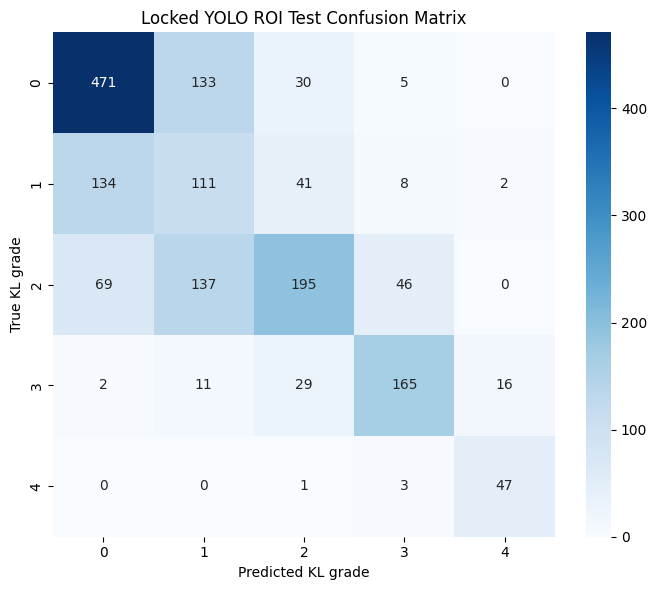

In [ ]:
class DenseNet121Model(nn.Module):
    def __init__(self):
        super().__init__()
        self.backbone = timm.create_model(
            "densenet121", pretrained=False, num_classes=5, drop_rate=0.20
        )

    @property
    def gradcam_target_layer(self):
        return self.backbone.features.norm5

    def forward(self, images: torch.Tensor) -> torch.Tensor:
        return self.backbone(images)


checkpoint = torch.load(CHECKPOINT_PATH, map_location="cpu", weights_only=False)
if checkpoint.get("loss_type") not in (None, "ce"):
    raise RuntimeError(f"Expected a CE checkpoint, got {checkpoint.get('loss_type')}")
if checkpoint.get("architecture") != "timm_densenet121_linear_gradcam":
    raise RuntimeError(f"Unexpected architecture: {checkpoint.get('architecture')}")

model = DenseNet121Model().to(DEVICE)
model.load_state_dict(checkpoint["model_state_dict"], strict=True)
model.eval()

all_paths, all_labels, all_probabilities = [], [], []
with torch.inference_mode():
    for images, labels, paths in tqdm(test_loader, desc="Locked ROI test evaluation"):
        probabilities = F.softmax(model(images.to(DEVICE, non_blocking=True)).float(), dim=1)
        all_paths.extend(paths)
        all_labels.extend(labels.numpy().tolist())
        all_probabilities.extend(probabilities.cpu().numpy())

labels = np.asarray(all_labels, dtype=int)
probabilities = np.asarray(all_probabilities, dtype=float)
predictions = probabilities.argmax(axis=1)
precision, recall, macro_f1, _ = precision_recall_fscore_support(
    labels, predictions, average="macro", zero_division=0
)
metrics = {
    "samples": int(len(labels)),
    "accuracy": float(accuracy_score(labels, predictions)),
    "qwk": float(cohen_kappa_score(labels, predictions, weights="quadratic")),
    "macro_precision": float(precision),
    "macro_recall": float(recall),
    "macro_f1": float(macro_f1),
    "macro_ap": float(average_precision_score(np.eye(5)[labels], probabilities, average="macro")),
    "macro_roc_auc_ovr": float(roc_auc_score(labels, probabilities, multi_class="ovr", average="macro")),
}
metrics["selection_reference_only"] = float(
    0.55 * metrics["qwk"] + 0.30 * metrics["macro_f1"] + 0.15 * metrics["macro_ap"]
)

prediction_frame = pd.DataFrame({
    "roi_path": all_paths,
    "true_grade": labels,
    "predicted_grade": predictions,
    "confidence": probabilities.max(axis=1),
})
for grade in range(5):
    prediction_frame[f"probability_grade_{grade}"] = probabilities[:, grade]
prediction_frame.to_csv(OUTPUT_DIR / "test_predictions.csv", index=False)
(OUTPUT_DIR / "test_metrics.json").write_text(json.dumps(metrics, indent=2))

print(json.dumps(metrics, indent=2))
print()
print(classification_report(labels, predictions, digits=4, zero_division=0))
(OUTPUT_DIR / "classification_report.txt").write_text(
    classification_report(labels, predictions, digits=4, zero_division=0)
)

figure, axis = plt.subplots(figsize=(7, 6))
sns.heatmap(
    confusion_matrix(labels, predictions, labels=range(5)), annot=True, fmt="d",
    cmap="Blues", xticklabels=range(5), yticklabels=range(5), ax=axis,
)
axis.set(xlabel="Predicted KL grade", ylabel="True KL grade", title="Locked YOLO ROI Test Confusion Matrix")
figure.tight_layout()
figure.savefig(OUTPUT_DIR / "test_confusion_matrix.png", dpi=180, bbox_inches="tight")
plt.show()

## Grad-CAM review

Correct cases show the evidence used when the prediction is right. Incorrect cases create two CAMs for each image: one for the predicted class and one for the true class. This helps distinguish anatomically plausible class confusion from shortcut evidence outside the joint.

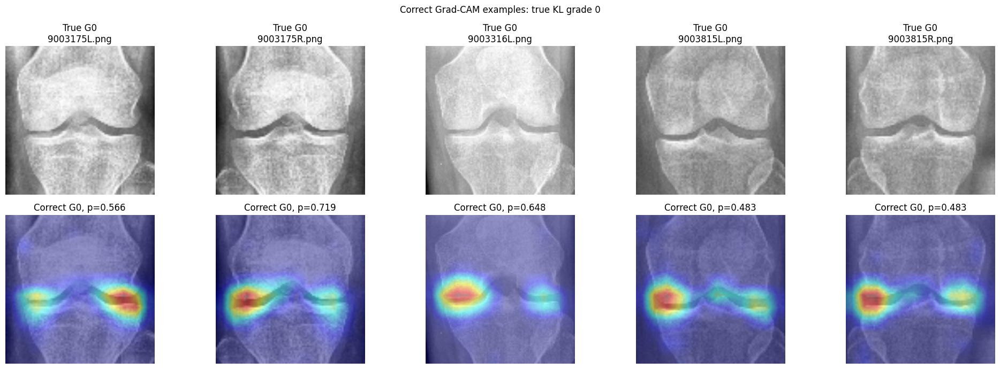

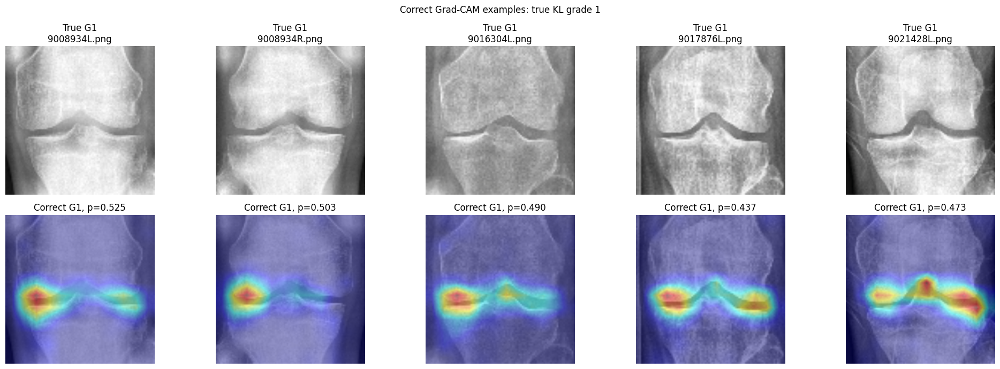

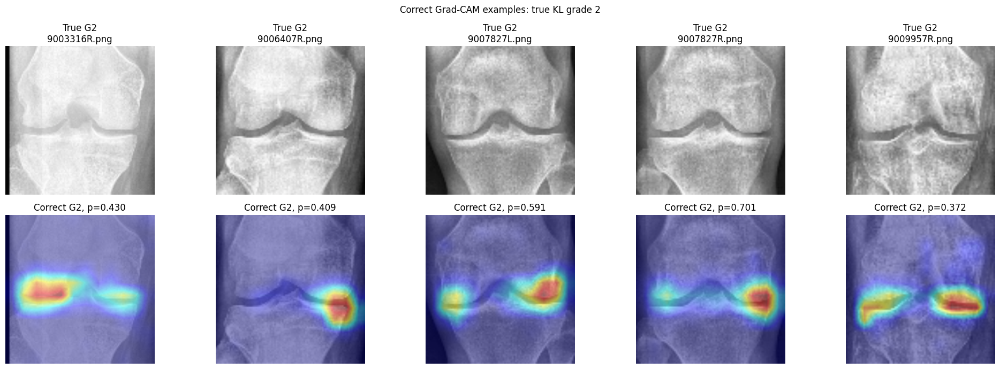

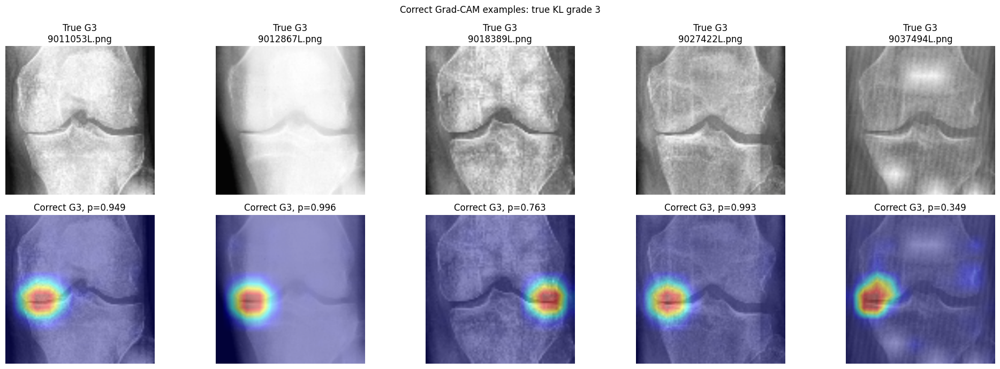

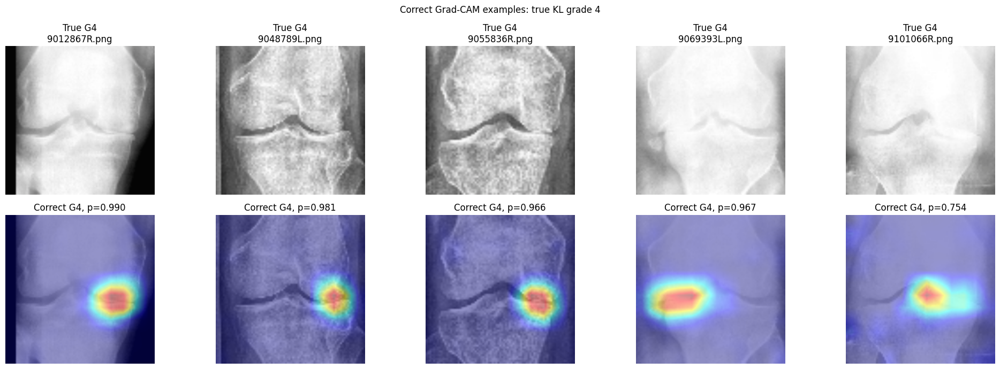

...

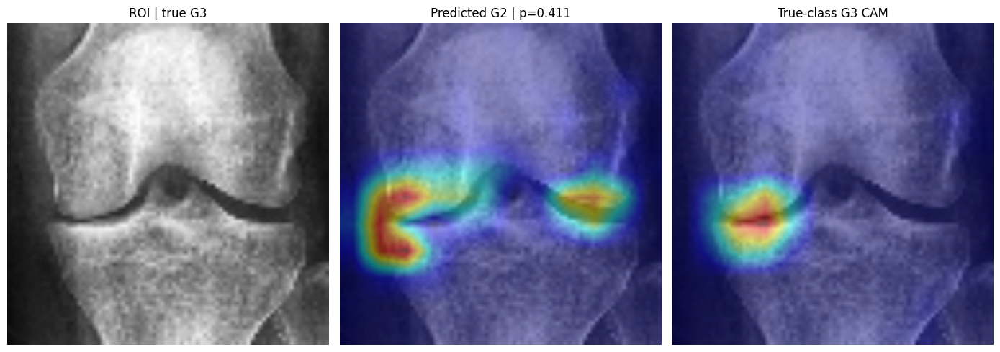

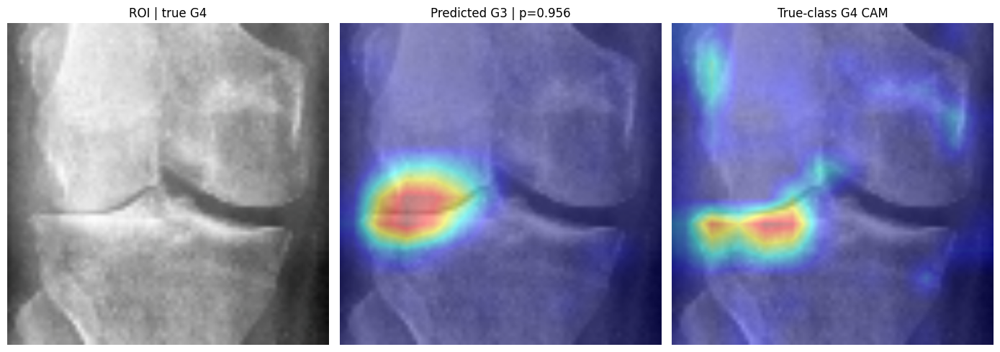

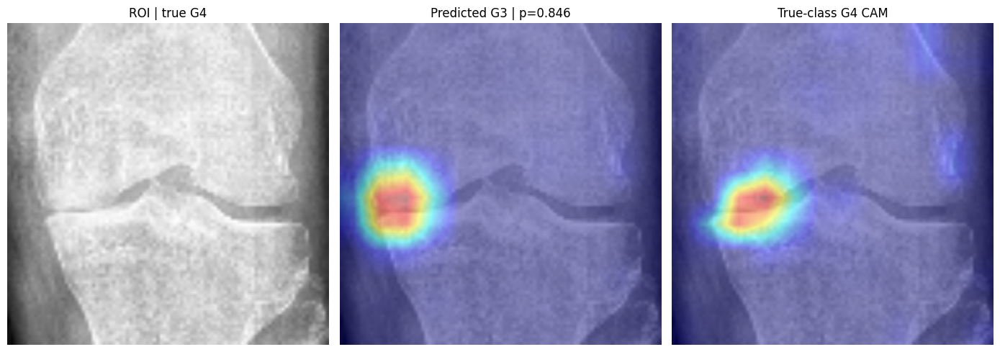

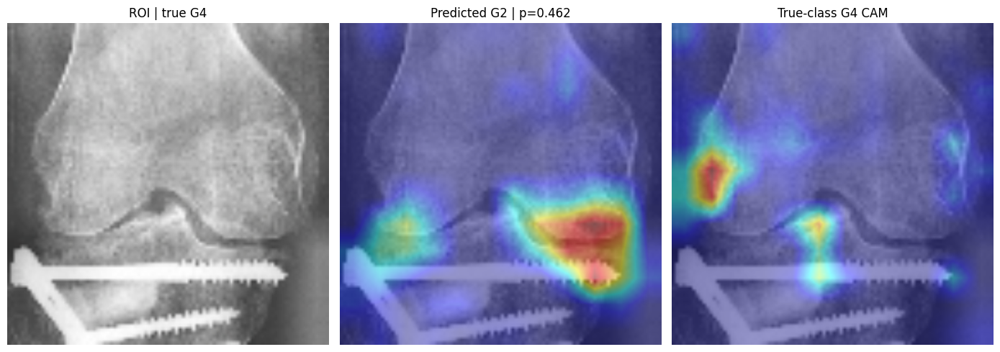

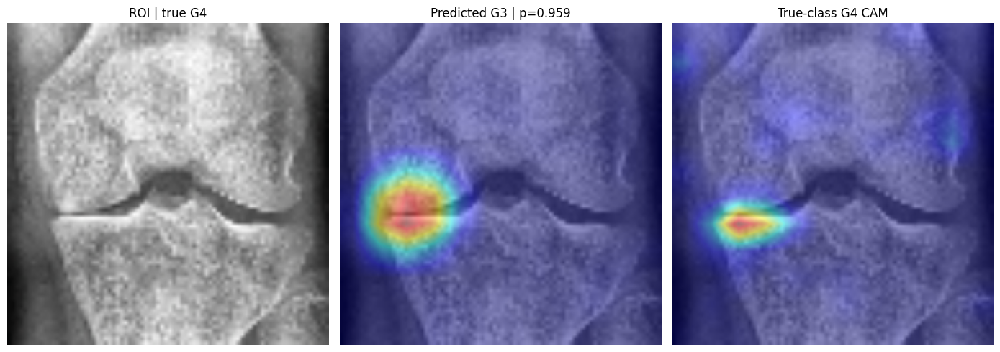

Correct Grad-CAM grids: /content/drive/MyDrive/Models/densenet121_paired_view_evaluation/2026-07-30_11-53-13_842110_UTC/gradcam_correct_by_true_grade
Misclassified predicted-vs-true CAM pairs: /content/drive/MyDrive/Models/densenet121_paired_view_evaluation/2026-07-30_11-53-13_842110_UTC/gradcam_misclassified_pairs


In [ ]:
class DenseNetGradCAM:
    def __init__(self, model: DenseNet121Model):
        self.model = model
        self.activations = None
        self.gradients = None
        self.handle = model.gradcam_target_layer.register_forward_hook(self._capture)

    def _capture(self, module, inputs, output):
        self.activations = output
        output.register_hook(self._capture_gradient)

    def _capture_gradient(self, gradient):
        self.gradients = gradient

    def __call__(self, tensor: torch.Tensor, class_index: int) -> np.ndarray:
        self.model.zero_grad(set_to_none=True)
        logits = self.model(tensor)
        logits[:, class_index].sum().backward()
        weights = self.gradients.mean(dim=(2, 3), keepdim=True)
        cam = F.relu((weights * self.activations).sum(dim=1, keepdim=True))
        cam = F.interpolate(
            cam, size=(INPUT_SIZE, INPUT_SIZE), mode="bilinear", align_corners=False
        )[0, 0]
        cam = cam.detach().cpu().numpy()
        return (cam - cam.min()) / (cam.max() - cam.min() + 1e-8)

    def remove(self):
        self.handle.remove()


def cam_overlay(image_rgb: np.ndarray, cam: np.ndarray, alpha: float = 0.42) -> np.ndarray:
    heatmap = cv2.applyColorMap(np.uint8(255 * cam), cv2.COLORMAP_JET)
    heatmap = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB)
    return cv2.addWeighted(image_rgb, 1.0 - alpha, heatmap, alpha, 0)


def render_case(path: str, class_index: int) -> tuple[np.ndarray, np.ndarray]:
    processed_rgb, tensor = prepare_roi(path)
    cam = gradcam(tensor.unsqueeze(0).to(DEVICE), class_index)
    return processed_rgb, cam_overlay(processed_rgb, cam)


gradcam = DenseNetGradCAM(model)
correct_dir = OUTPUT_DIR / "gradcam_correct_by_true_grade"
incorrect_dir = OUTPUT_DIR / "gradcam_misclassified_pairs"
correct_dir.mkdir()
incorrect_dir.mkdir()

for true_grade in range(5):
    cases = prediction_frame[
        (prediction_frame.true_grade == true_grade)
        & (prediction_frame.predicted_grade == true_grade)
    ].head(CASES_PER_GRADE)
    figure, axes = plt.subplots(2, CASES_PER_GRADE, figsize=(4 * CASES_PER_GRADE, 7))
    for column in range(CASES_PER_GRADE):
        for row in range(2):
            axes[row, column].axis("off")
        if column >= len(cases):
            continue
        case = cases.iloc[column]
        source, overlay = render_case(case.roi_path, true_grade)
        axes[0, column].imshow(source)
        axes[0, column].set_title(f"True G{true_grade}\n{Path(case.roi_path).name}")
        axes[1, column].imshow(overlay)
        axes[1, column].set_title(f"Correct G{true_grade}, p={case.confidence:.3f}")
        axes[0, column].axis("off")
        axes[1, column].axis("off")
    figure.suptitle(f"Correct Grad-CAM examples: true KL grade {true_grade}")
    figure.tight_layout()
    figure.savefig(correct_dir / f"grade_{true_grade}_correct.png", dpi=160, bbox_inches="tight")
    plt.show()
    plt.close(figure)

misclassified_rows = []
for true_grade in range(5):
    cases = prediction_frame[
        (prediction_frame.true_grade == true_grade)
        & (prediction_frame.predicted_grade != true_grade)
    ].head(CASES_PER_GRADE)
    for case_number, (_, case) in enumerate(cases.iterrows(), start=1):
        source, predicted_overlay = render_case(case.roi_path, int(case.predicted_grade))
        _, true_overlay = render_case(case.roi_path, int(case.true_grade))
        figure, axes = plt.subplots(1, 3, figsize=(14, 5))
        axes[0].imshow(source)
        axes[0].set_title(f"ROI | true G{case.true_grade}")
        axes[1].imshow(predicted_overlay)
        axes[1].set_title(f"Predicted G{case.predicted_grade} | p={case.confidence:.3f}")
        axes[2].imshow(true_overlay)
        axes[2].set_title(f"True-class G{case.true_grade} CAM")
        for axis in axes:
            axis.axis("off")
        figure.tight_layout()
        output_path = incorrect_dir / (
            f"true_g{case.true_grade}_pred_g{case.predicted_grade}_{case_number}_{Path(case.roi_path).stem}.png"
        )
        figure.savefig(output_path, dpi=160, bbox_inches="tight")
        plt.show()
        plt.close(figure)
        misclassified_rows.append({
            "roi_path": case.roi_path,
            "true_grade": int(case.true_grade),
            "predicted_grade": int(case.predicted_grade),
            "confidence": float(case.confidence),
            "cam_pair_path": str(output_path),
        })

pd.DataFrame(misclassified_rows).to_csv(OUTPUT_DIR / "gradcam_misclassified_index.csv", index=False)
gradcam.remove()
print("Correct Grad-CAM grids:", correct_dir)
print("Misclassified predicted-vs-true CAM pairs:", incorrect_dir)

## Save evaluation manifest

Use the output directory as the evidence package for the report. Promotion to the application requires both acceptable test metrics and a manual review showing joint-space-focused Grad-CAMs without systematic border, marker, femur, or tibia shortcuts.

In [ ]:
manifest = {
    "checkpoint_path": str(CHECKPOINT_PATH),
    "test_roi_root": str(ROI_TEST_ROOT),
    "preprocessing": "CLAHE(1.25) -> square pad -> resize(384) -> ImageNet normalization",
    "evaluation_only": True,
    "metrics": metrics,
    "correct_gradcam_directory": str(correct_dir),
    "misclassified_gradcam_directory": str(incorrect_dir),
}
(OUTPUT_DIR / "evaluation_manifest.json").write_text(json.dumps(manifest, indent=2))
print("Evaluation complete. Evidence package:", OUTPUT_DIR)

Evaluation complete. Evidence package: /content/drive/MyDrive/Models/densenet121_paired_view_evaluation/2026-07-30_11-53-13_842110_UTC
